# Projection Angle Shift Demo

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

import torch

import tomopy

from skimage.transform import radon, iradon
from cv2 import resize, remap
import numpy.ma as ma

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def interpolated_put(a, indices, values):
    def put(a, indices, remain_axes, v):
        if len(remain_axes) == 0:
            return np.put(a, np.ravel_multi_index(indices.T.astype(int), a.shape), v)
        
        this_axis = remain_axes[-1]
        indices_floor, indices_ceil = indices.copy(), indices.copy()
        indices_floor[:, this_axis] = np.floor(indices_floor[:, this_axis]).clip(0, a.shape[this_axis]-1)
        indices_ceil[:, this_axis]  = np.ceil(indices_ceil[:, this_axis]).clip(0, a.shape[this_axis]-1)
        
        v_floor = v * (indices_ceil[:, this_axis] - indices[:, this_axis])
        v_ceil = v - v_floor
        
        put(a, indices_floor, remain_axes[:-1], v_floor)
        put(a, indices_ceil, remain_axes[:-1], v_ceil)
    
    put(a, indices, list(range(indices.shape[-1])), values)

def get_phantom(phantom_size, dot_indices, background):
    dot_indices = dot_indices[:, (dot_indices >= 0).all(axis=0)]
    dot_indices = dot_indices[:, (dot_indices[0] < phantom_size[0]-1) & (dot_indices[1] < phantom_size[1]-1)].T
    
    phantom = np.ones(phantom_size, dtype=float) * background
    interpolated_put(phantom, dot_indices, np.ones((dot_indices.shape[0])))
    
    coor = np.mgrid[0:phantom_size[0], 0:phantom_size[1]]
    mask = ((coor[0] - phantom_size[0] // 2) ** 2 + (coor[1] - phantom_size[1] // 2) ** 2) < (phantom_size[1] // 2) ** 2

    phantom[~mask] = 0
    
    return phantom

## Phantom Parameters

In [3]:
phantom_size = (512, 512)    # The size of the phantom image to be created
number_dots = 500            # The number of dots to be placed in the phantom image
background = 0.05            # The background value of the phantom image
number_projection = 360      # Number of projections

assumed_angles = np.linspace(0, np.pi, number_projection)

## Projection Angle Shift

We first define the projection angle shift function $D$ as below:
$$
D(\hat{\theta}_i) = \theta_i - \hat{\theta}_i = A \times \cos(\omega \hat{\theta}_i + \phi)
$$
where $\theta$ is the true projection angle and $\hat{\theta}_i = \frac{i}{N}\pi$ is the assumed projection angle.

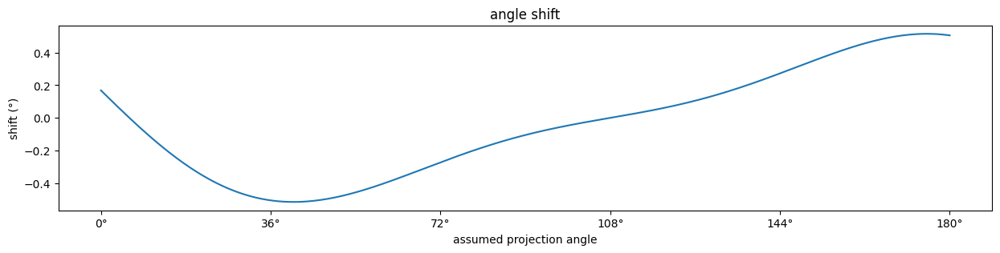

In [4]:
# The parameters for the distortion curve
amplitude = 0.01
frequency = 2
phase = 0.3 * np.pi

shift = amplitude * np.cos(assumed_angles * frequency + phase) + 0.005 * np.cos(assumed_angles * 3 + 0.7 * np.pi)
true_angles = assumed_angles + shift

# Plot the distortion
plt.figure(figsize=(15, 3))
plt.plot(assumed_angles * 180 / np.pi, shift * 180 / np.pi)
plt.xlabel('assumed projection angle')
plt.ylabel('shift (°)')
plt.title('angle shift')

tick_locs = np.linspace(0, 180, 6)
tick_labels = [f'{i:.0f}°' for i in tick_locs]
plt.xticks(tick_locs, tick_labels)
plt.show()

### True angles vs assumed angles

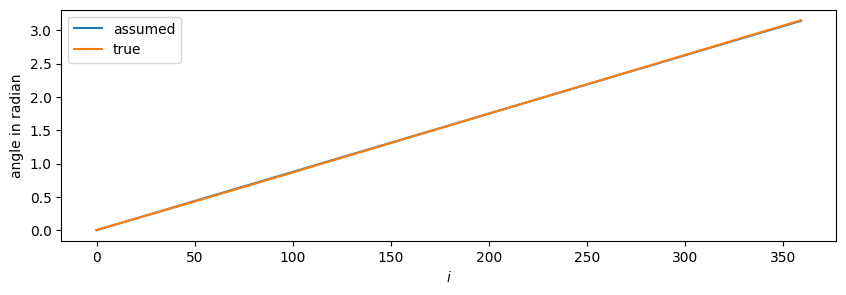

In [5]:
plt.figure(figsize=(10, 3))
plt.plot(assumed_angles, label='assumed')
plt.plot(true_angles, label='true')

plt.xlabel('$i$')
plt.ylabel('angle in radian')

_ = plt.legend()

## Generate a phantom image and its corresponding sinogram with true angles

Text(0.5, 1.0, 'sinogram')

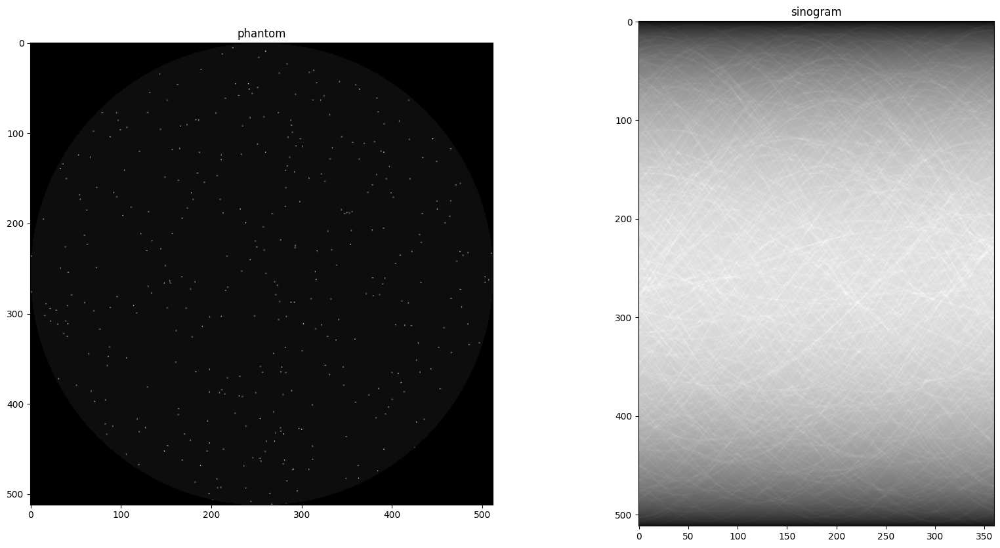

In [6]:
random_dots = np.random.uniform(0, min(*phantom_size), number_dots*2).reshape(2, -1)

phantom = get_phantom(phantom_size, random_dots, background)
sinogram = radon(phantom, true_angles / np.pi * 180)    # (phantom_size, number_projection)

# plot the phantom and the sinogram
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(phantom, cmap='gray')
axes[0].set_title('phantom')

axes[1].imshow(sinogram, cmap='gray')
axes[1].set_title('sinogram')

## Reconstruct the phantom with the assumed projection angles

Text(0.5, 1.0, 'reconstruction with assumed angles')

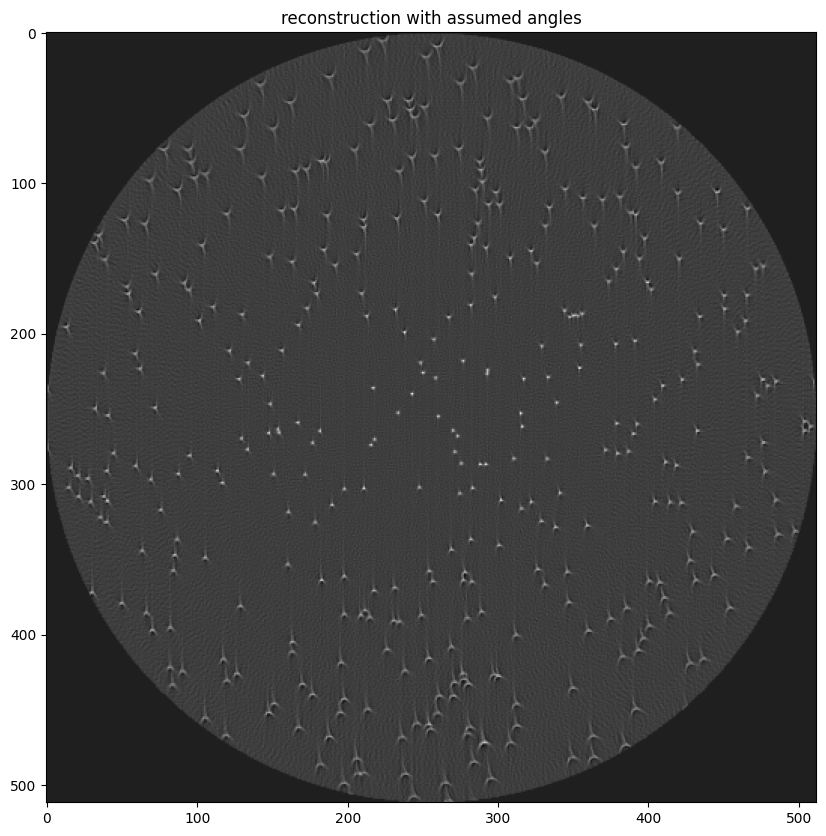

In [7]:
tampered_reconstructed = iradon(sinogram, assumed_angles / np.pi * 180, filter_name='ramp')

plt.figure(figsize=(10, 10))
plt.imshow(tampered_reconstructed, cmap='gray')
plt.title('reconstruction with assumed angles')

## Reconstruct the phantom with the true projection angles

Text(0.5, 1.0, 'reconstruction with true angles')

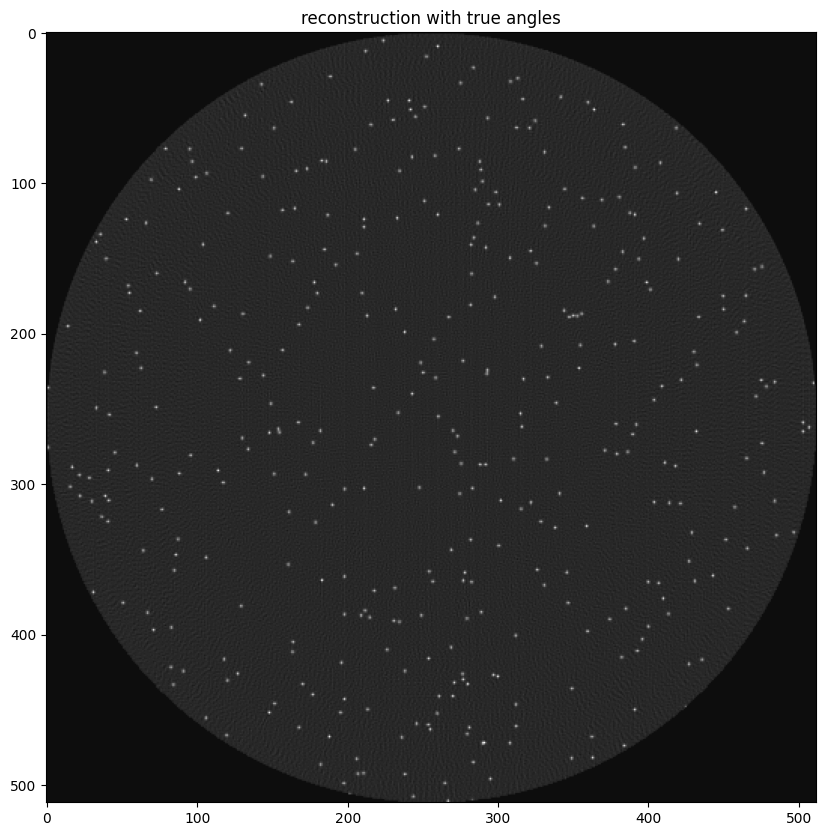

In [8]:
true_reconstructed = iradon(sinogram, true_angles / np.pi * 180, filter_name='ramp')

plt.figure(figsize=(10, 10))
plt.imshow(true_reconstructed, cmap='gray')
plt.title('reconstruction with true angles')

In [9]:
sinogram.shape

(512, 360)

## Baysian optimization

In [16]:
from theta_correction import theta_correction

theta = theta_correction(sinogram.T, np.linspace(0, np.pi, 360), 8, (-0.015, 0.015), init_points=50, n_iter=300)

|   iter    |  target   |  input0   |  input1   |  input2   |  input3   |  input4   |  input5   |  input6   |  input7   |
-------------------------------------------------------------------------------------------------------------------------
| 56        | -0.03978  | -0.000485 | -0.005666 | -0.004594 | -0.004201 | 0.006236  | 0.001433  | 0.005307  | 0.007946  |
| 65        | -0.03886  | 0.00421   | -0.004176 | -0.003663 | -0.003882 | -0.001894 | -0.004039 | 0.005809  | 0.003723  |
| 87        | -0.03784  | 0.003528  | -0.006213 | -0.01118  | -0.00578  | -0.002313 | -0.002474 | 0.004156  | 0.009861  |
| 95        | -0.03775  | -0.000790 | -0.008642 | -0.015    | -0.008966 | -0.005317 | -9.564e-0 | 0.004637  | 0.007155  |
| 96        | -0.03725  | -0.001342 | -0.00926  | -0.0122   | -0.007399 | -0.003716 | -0.001748 | 0.00546   | 0.01051   |
| 114       | -0.03702  | -0.000620 | -0.009111 | -0.01006  | -0.004961 | -0.002644 | 0.0005194 | 0.004091  | 0.008383  |
| 127       | -0.037    

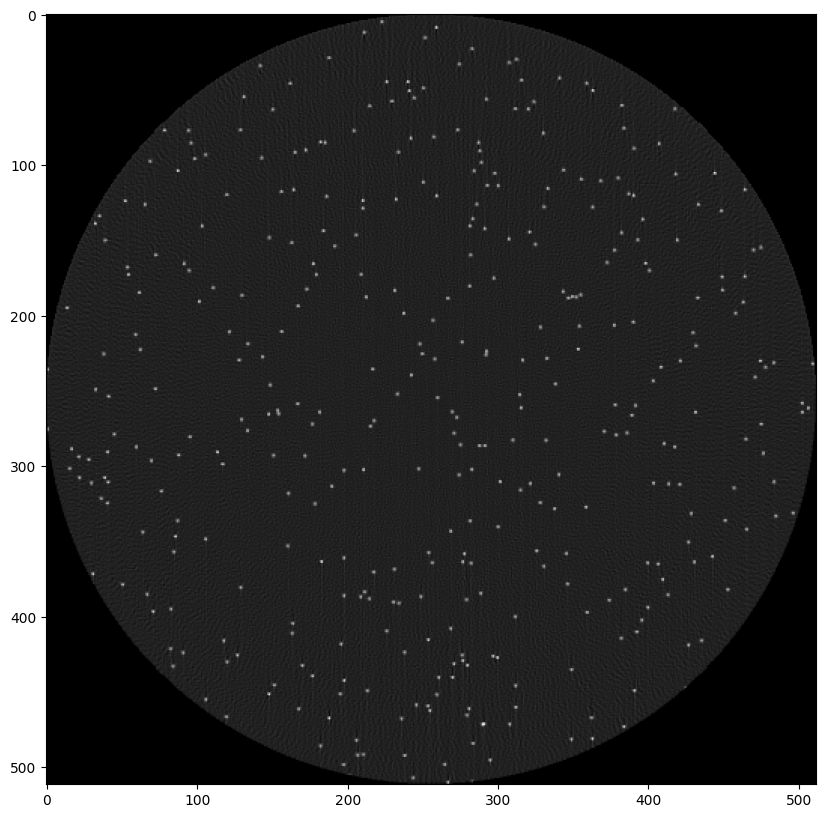

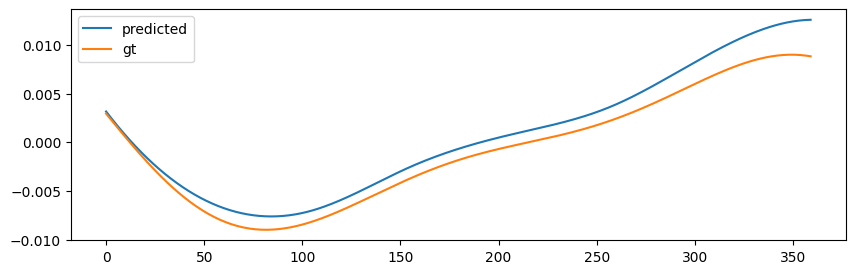

In [21]:
n_angles = sinogram.shape[-1]

recon = tomopy.recon(sinogram.T[:, np.newaxis, :],
                 theta,
                 center=sinogram.shape[0]//2+0.5,
                 algorithm=tomopy.astra,
                 options={'proj_type': 'cuda', 'method': 'FBP_CUDA'},
                 ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=1.0, val=0)[0]

plt.figure(figsize=(10, 10))
plt.imshow(recon, cmap='gray')

plt.figure(figsize=(10, 3))
plt.plot(theta - np.linspace(0, np.pi, n_angles), label='predicted')
plt.plot(shift, label='gt')
plt.legend()

In [14]:
real_sino = np.load('sinogram.npy')

In [15]:
real_sino.shape

(600, 2560)

In [82]:
theta = theta_correction(real_sino, np.linspace(0, np.pi, 600), 10, (-0.01, 0.01), 100, 500)

|   iter    |  target   |  input0   |  input1   |  input2   |  input3   |  input4   |  input5   |  input6   |  input7   |  input8   |  input9   |
-------------------------------------------------------------------------------------------------------------------------------------------------
| 8         | -0.000316 | 0.0002542 | -0.002251 | -0.002425 | 0.001307  | 0.001624  | 0.007953  | 0.009281  | 0.001335  | 0.005233  | 0.000148  |
| 95        | -0.000316 | -0.008052 | -0.007529 | -0.003463 | -0.005195 | -0.005388 | 0.00115   | 0.002665  | -0.00793  | -0.007404 | -0.008013 |
| 102       | -0.000316 | -0.000568 | -0.006389 | -0.003641 | -0.003134 | -0.005655 | 0.01      | 0.01      | 0.002587  | 0.002016  | -0.005817 |
| 108       | -0.000316 | -0.003606 | -0.006617 | -0.003069 | -0.004018 | -0.006406 | 0.004288  | 0.004287  | -0.000508 | -0.002528 | -0.003074 |
| 113       | -0.000316 | -0.003144 | -0.01     | -0.003755 | -0.004088 | -0.005716 | 0.003316  | 0.003276  | -0.000741 | -0

In [83]:
theta.shape

(600,)

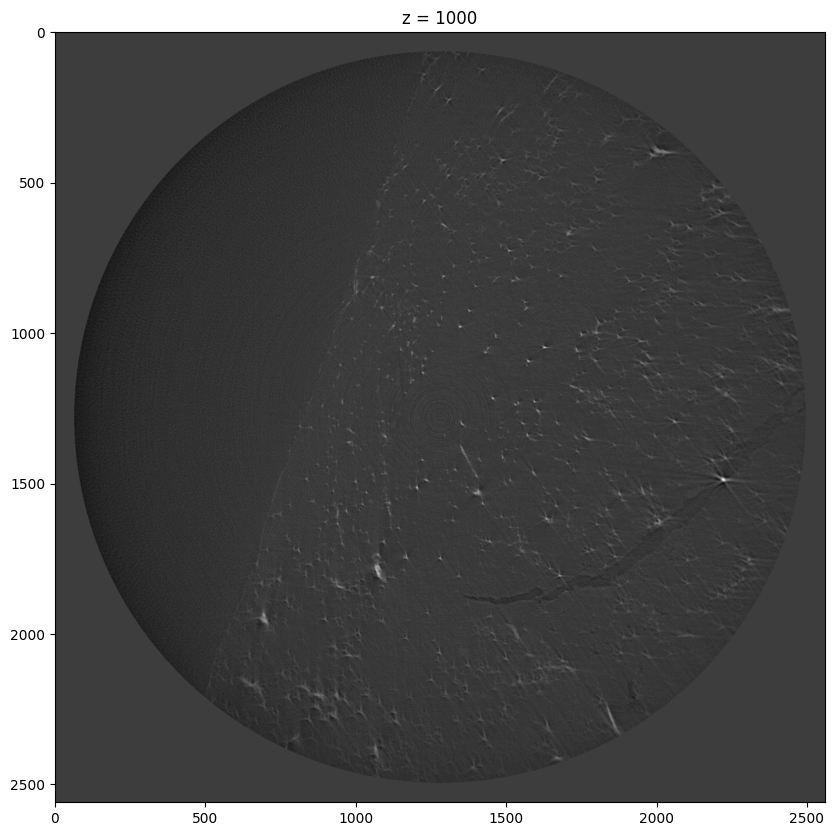

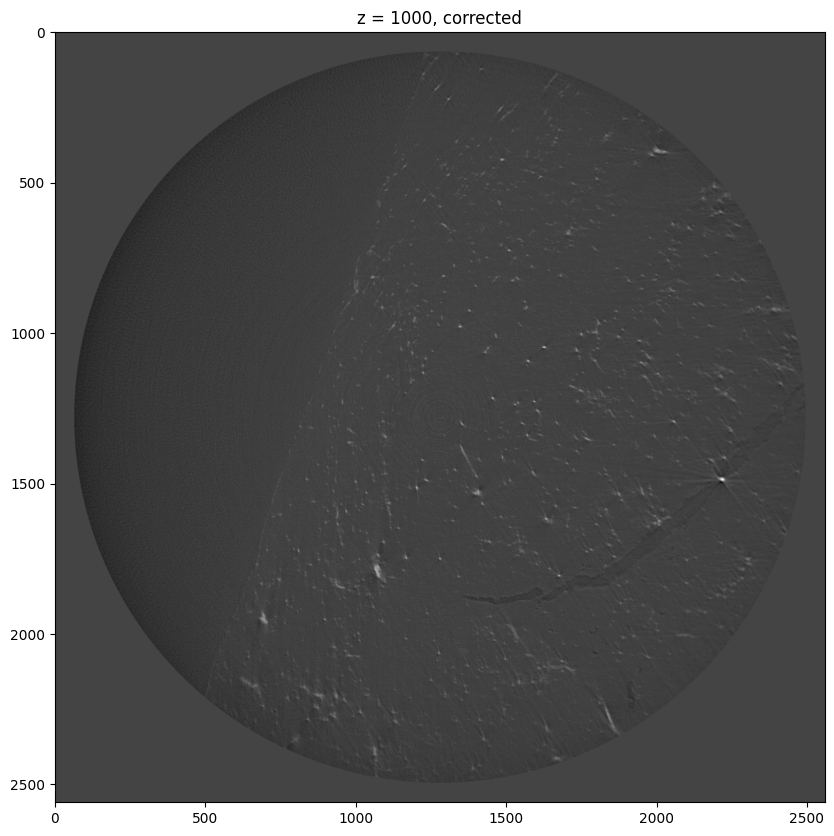

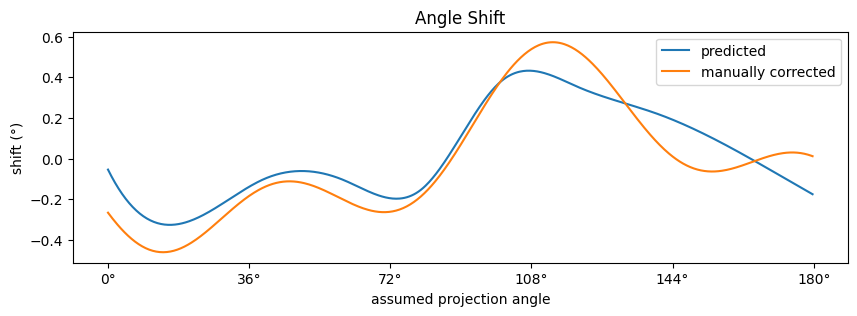

In [91]:
recon = tomopy.recon(real_sino[:, np.newaxis, :],
                 np.linspace(0, np.pi, 600),
                 center=None,
                 algorithm=tomopy.astra,
                 options=options,
                 ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=0.95, val=0)[0]

plt.figure(figsize=(10, 10))
plt.title('z = 1000')
plt.imshow(recon, cmap='binary')

recon = tomopy.recon(real_sino[:, np.newaxis, :],
                 theta,
                 center=None,
                 algorithm=tomopy.astra,
                 options=options,
                 ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=0.95, val=0)[0]

plt.figure(figsize=(10, 10))
plt.title('z = 1000, corrected')
plt.imshow(recon, cmap='binary')

shift = 0.0039 * np.cos(theta * 5.2 + 2.36) + 0.0063 * np.cos(theta * 2.1 + 1.88)

plt.figure(figsize=(10, 3))
plt.title('Angle Shift')
plt.plot((theta - np.linspace(0, np.pi, 600)) / np.pi * 180, label='predicted')
plt.plot(shift / np.pi * 180, label='manually corrected')
plt.legend()

plt.xlabel('assumed projection angle')
plt.ylabel('shift (°)')

tick_locs = np.linspace(0, 600, 6)
tick_labels = [f'{i / 600 * 180:.0f}°' for i in tick_locs]
plt.xticks(tick_locs, tick_labels)
plt.show()

In [88]:
import matplotlib.image
# matplotlib.image.imsave('assumed_recon.png', assumed_recon[0], cmap='binary')
matplotlib.image.imsave('cor_recon.png', recon, cmap='binary')

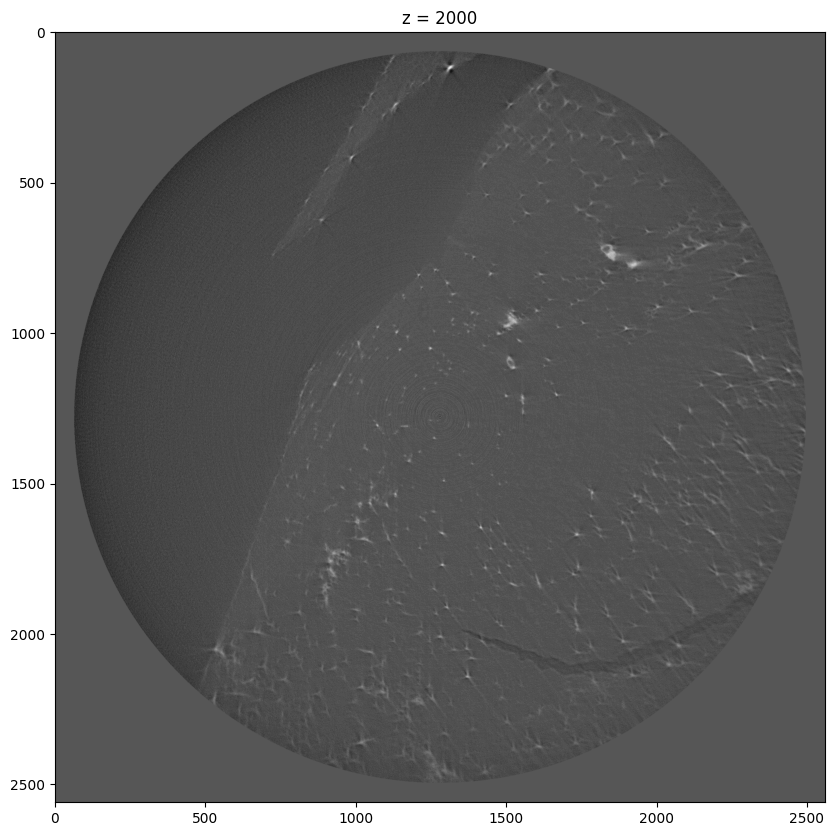

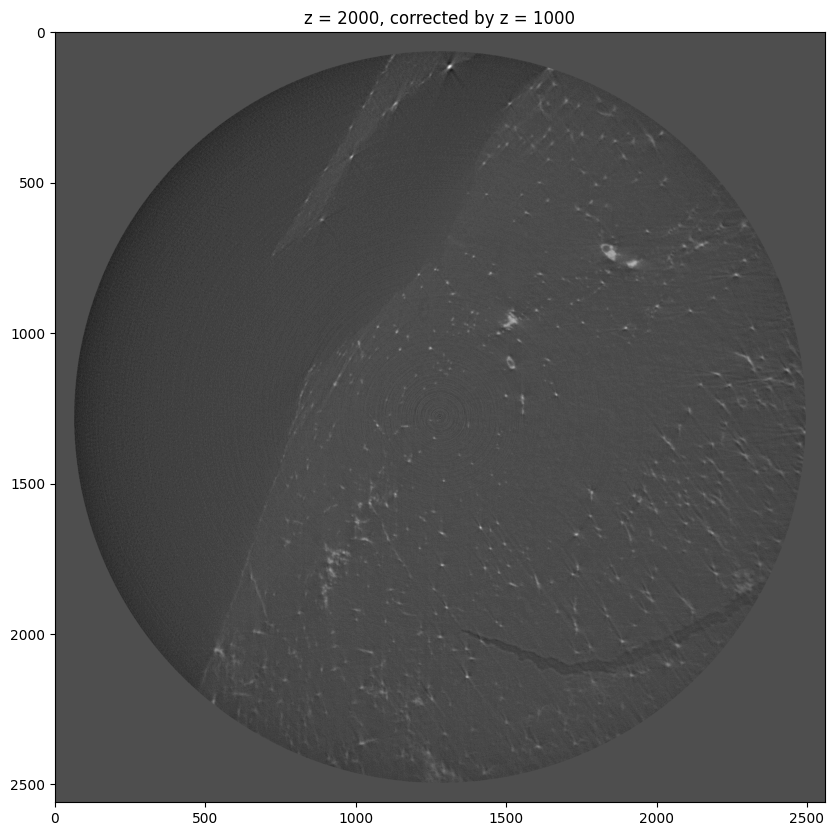

In [93]:
sino2000 = np.load('sinogram2000.npy')

recon = tomopy.recon(sino2000[:, np.newaxis, :],
                 np.linspace(0, np.pi, 600),
                 center=None,
                 algorithm=tomopy.astra,
                 options=options,
                 ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=0.95, val=0)[0]

plt.figure(figsize=(10, 10))
plt.title('z = 2000')
plt.imshow(recon, cmap='binary')

matplotlib.image.imsave('assumed_recon.png', recon, cmap='binary')

recon = tomopy.recon(sino2000[:, np.newaxis, :],
                 theta,
                 center=None,
                 algorithm=tomopy.astra,
                 options=options,
                 ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=0.95, val=0)[0]

plt.figure(figsize=(10, 10))
plt.title('z = 2000, corrected by z = 1000')
plt.imshow(recon, cmap='binary')

matplotlib.image.imsave('cor_recon.png', recon, cmap='binary')

In [ ]:
import matplotlib.image
# matplotlib.image.imsave('assumed_recon.png', assumed_recon[0], cmap='binary')
matplotlib.image.imsave('cor_recon.png', recon, cmap='binary')

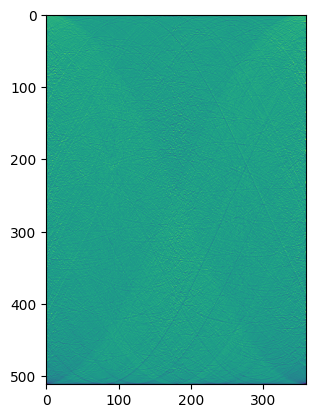

In [65]:
recon = tomopy.recon(sinogram.T[:, np.newaxis, :],
                     theta,
                     center=None,
                     algorithm=tomopy.astra,
                     options=options,
                     ncore=1)
recon = tomopy.circ_mask(recon, axis=0, ratio=1.0, val=0)
reproject = project(recon,
                    theta,
                    pad=False,
                    center=None)[:, 0, :].T

plt.imshow(reproject - sinogram)

## View Angle Estimation

/mnt/nas/homes/toosyou/.local/share/virtualenvs/ct_reconstruction-weh7J4Q7/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


tensor([0.0000, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014, 0.5014,
        0.5014, 0.5014, 0.5014, 0.5014, 

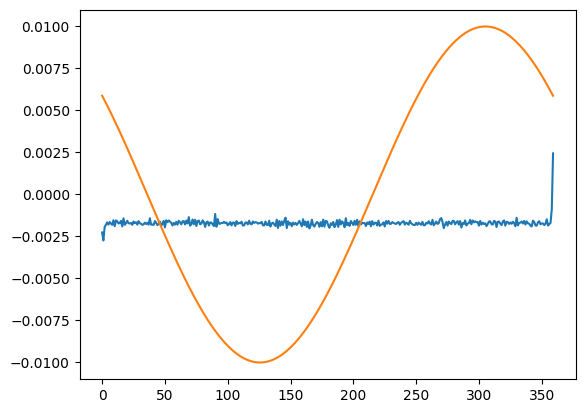

tensor([0.2732, 0.2865, 0.2179, 0.2020, 0.1929, 0.2015, 0.1892, 0.1999, 0.2003,
        0.1826, 0.2076, 0.1775, 0.1846, 0.1968, 0.1911, 0.1865, 0.2062, 0.1696,
        0.2041, 0.1918, 0.1820, 0.1960, 0.1968, 0.1959, 0.2020, 0.1859, 0.1938,
        0.1921, 0.2002, 0.1838, 0.1958, 0.2004, 0.2060, 0.2007, 0.1933, 0.1992,
        0.1944, 0.1966, 0.1688, 0.2054, 0.2049, 0.2021, 0.1828, 0.1958, 0.2067,
        0.1964, 0.1901, 0.2104, 0.1955, 0.1881, 0.2136, 0.1779, 0.1864, 0.1782,
        0.1857, 0.1963, 0.2075, 0.1959, 0.2013, 0.1896, 0.2005, 0.1807, 0.1924,
        0.1991, 0.1820, 0.1858, 0.1988, 0.1809, 0.1890, 0.1634, 0.2102, 0.1955,
        0.1755, 0.1964, 0.1793, 0.2075, 0.1798, 0.1821, 0.2017, 0.1943, 0.1784,
        0.1948, 0.2137, 0.1875, 0.1892, 0.2069, 0.1905, 0.1935, 0.2058, 0.1983,
        0.1453, 0.2083, 0.1730, 0.1992, 0.1978, 0.1943, 0.1929, 0.1875, 0.1940,
        0.1941, 0.2079, 0.1981, 0.1918, 0.2066, 0.1911, 0.1958, 0.2076, 0.1848,
        0.1990, 0.1938, 0.1939, 0.1901, 

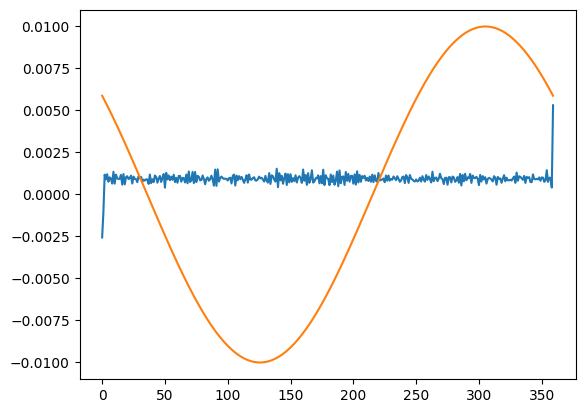

tensor([0.2493, 0.0952, 0.8925, 0.8939, 0.8669, 0.9085, 0.8868, 0.8907, 0.9235,
        0.8574, 0.9196, 0.8728, 0.8882, 0.8943, 0.8931, 0.8699, 0.9282, 0.8703,
        0.9258, 0.8879, 0.8765, 0.8932, 0.8892, 0.8739, 0.9213, 0.8840, 0.8925,
        0.8959, 0.9145, 0.8807, 0.8885, 0.8816, 0.9099, 0.9005, 0.9048, 0.8978,
        0.8980, 0.9261, 0.8728, 0.9179, 0.8991, 0.9142, 0.8764, 0.8799, 0.9167,
        0.8945, 0.8761, 0.9111, 0.8897, 0.8644, 0.9487, 0.8662, 0.8928, 0.8737,
        0.8999, 0.8816, 0.8978, 0.8701, 0.9113, 0.8899, 0.9176, 0.8791, 0.8741,
        0.9097, 0.8897, 0.8888, 0.9157, 0.8713, 0.9189, 0.8553, 0.9081, 0.9060,
        0.8547, 0.9160, 0.8577, 0.9093, 0.8782, 0.8791, 0.9016, 0.9022, 0.8747,
        0.8928, 0.9280, 0.8975, 0.8849, 0.9046, 0.8973, 0.8750, 0.8949, 0.9371,
        0.8473, 0.9341, 0.8463, 0.9039, 0.8914, 0.8795, 0.8872, 0.8934, 0.8923,
        0.8935, 0.9041, 0.8904, 0.8864, 0.9221, 0.8794, 0.8660, 0.9341, 0.8797,
        0.8997, 0.8785, 0.8936, 0.8820, 

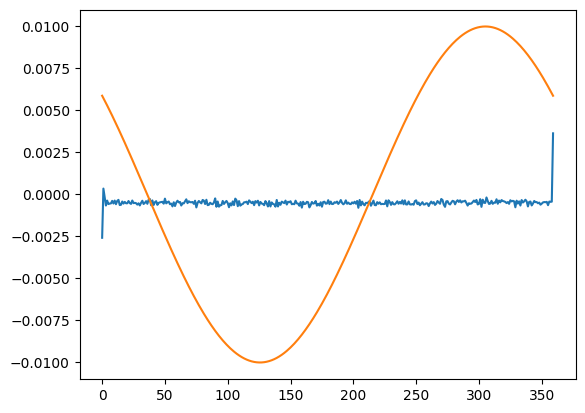

tensor([0.2207, 0.9700, 0.0190, 0.0728, 0.0426, 0.0651, 0.0617, 0.0597, 0.0442,
        0.0601, 0.0425, 0.0647, 0.0435, 0.0380, 0.0718, 0.0685, 0.0486, 0.0612,
        0.0508, 0.0599, 0.0589, 0.0451, 0.0587, 0.0628, 0.0418, 0.0588, 0.0571,
        0.0597, 0.0683, 0.0607, 0.0732, 0.0561, 0.0436, 0.0641, 0.0568, 0.0463,
        0.0616, 0.0357, 0.0326, 0.0710, 0.0416, 0.0700, 0.0523, 0.0468, 0.0696,
        0.0570, 0.0534, 0.0515, 0.0506, 0.0603, 0.0292, 0.0599, 0.0526, 0.0488,
        0.0658, 0.0634, 0.0787, 0.0544, 0.0766, 0.0545, 0.0431, 0.0534, 0.0521,
        0.0739, 0.0591, 0.0596, 0.0455, 0.0338, 0.0581, 0.0465, 0.0524, 0.0528,
        0.0519, 0.0624, 0.0445, 0.0854, 0.0564, 0.0445, 0.0540, 0.0589, 0.0375,
        0.0429, 0.0632, 0.0372, 0.0724, 0.0691, 0.0566, 0.0640, 0.0654, 0.0530,
        0.0283, 0.0807, 0.0496, 0.0820, 0.0733, 0.0699, 0.0449, 0.0637, 0.0524,
        0.0445, 0.0602, 0.0845, 0.0609, 0.0722, 0.0483, 0.0691, 0.0286, 0.0416,
        0.0770, 0.0464, 0.0754, 0.0676, 

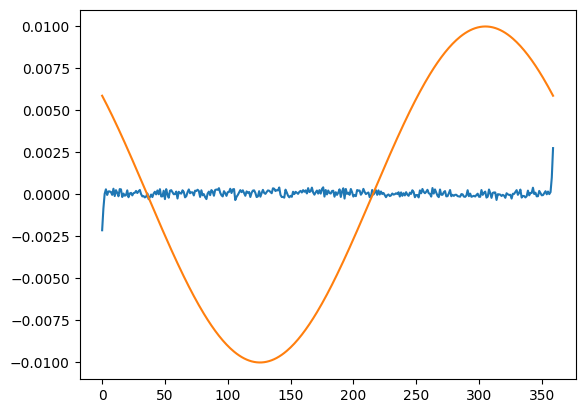

tensor([2.1204e-01, 8.7031e-02, 9.9641e-01, 9.6588e-01, 3.2809e-03, 9.7971e-01,
        9.7899e-01, 9.8376e-01, 2.5217e-03, 9.6227e-01, 1.0447e-02, 9.7189e-01,
        9.8800e-01, 1.1762e-02, 9.6509e-01, 9.6526e-01, 1.6929e-02, 9.9391e-01,
        8.1753e-03, 4.5383e-03, 9.7265e-01, 1.8282e-02, 9.9334e-01, 9.8912e-01,
        6.1992e-03, 9.9067e-01, 9.8864e-01, 9.7624e-01, 9.9005e-01, 9.7882e-01,
        9.6956e-01, 9.9743e-01, 1.2992e-02, 1.1286e-02, 1.9799e-02, 1.4680e-02,
        9.9326e-01, 3.1193e-02, 1.7794e-02, 4.8160e-04, 1.7138e-02, 9.9354e-01,
        9.8157e-01, 9.9937e-01, 9.7328e-01, 9.9855e-01, 9.6501e-01, 1.3262e-02,
        1.2079e-02, 9.7511e-01, 2.9480e-02, 9.6589e-01, 9.9983e-01, 2.1126e-02,
        9.7546e-01, 9.7068e-01, 9.8464e-01, 9.9810e-01, 9.9741e-01, 9.8070e-01,
        2.6308e-02, 9.8237e-01, 9.9092e-01, 9.9403e-01, 9.7219e-01, 9.8277e-01,
        1.9237e-02, 1.1396e-02, 9.8473e-01, 9.6640e-01, 9.9133e-01, 9.8548e-01,
        9.8566e-01, 6.3724e-03, 9.7487e-

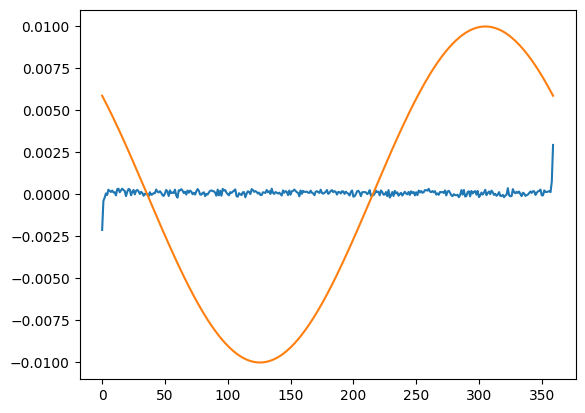

tensor([2.0134e-01, 4.2922e-02, 2.0894e-02, 9.9331e-01, 2.9073e-03, 9.6875e-01,
        9.7568e-01, 9.8282e-01, 9.7318e-01, 9.8594e-01, 9.8480e-01, 6.0245e-03,
        9.6549e-01, 9.6057e-01, 9.8476e-01, 9.7166e-01, 9.6100e-01, 9.7022e-01,
        9.7588e-01, 1.0954e-02, 9.8221e-01, 9.6348e-01, 9.6560e-01, 5.4944e-03,
        9.8328e-01, 9.6997e-01, 9.9918e-01, 9.7565e-01, 9.6913e-01, 9.7854e-01,
        9.9657e-01, 9.8208e-01, 9.9033e-01, 8.5152e-03, 9.9485e-01, 9.9894e-01,
        9.9765e-01, 1.1256e-02, 9.8533e-01, 2.2867e-03, 6.7484e-06, 9.9079e-01,
        9.9131e-01, 9.6719e-01, 9.8035e-01, 9.8619e-01, 9.7813e-01, 9.8812e-01,
        3.6371e-03, 9.9702e-03, 9.9271e-01, 9.6985e-01, 9.8050e-01, 1.0020e-02,
        9.7306e-01, 9.9057e-01, 9.8654e-01, 9.9038e-01, 9.6795e-01, 7.3236e-03,
        2.0366e-02, 9.7292e-01, 9.7234e-01, 9.6422e-01, 9.7377e-01, 9.8990e-01,
        9.8111e-01, 5.7014e-04, 9.7389e-01, 9.8801e-01, 9.7404e-01, 9.8024e-01,
        9.9817e-01, 9.8881e-01, 5.6613e-

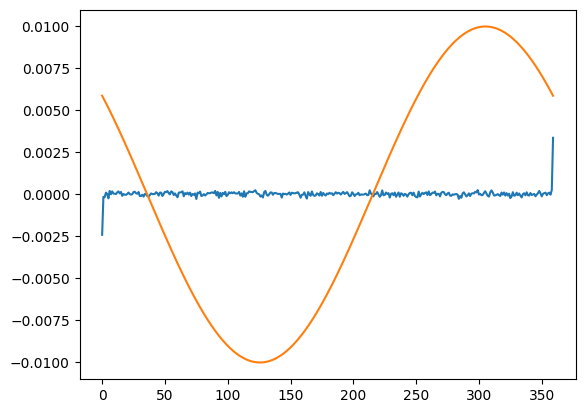

tensor([2.1792e-01, 1.5941e-02, 1.8121e-02, 9.8852e-01, 9.9584e-01, 2.4986e-02,
        9.7687e-01, 9.9823e-01, 9.7940e-01, 9.9358e-01, 9.9451e-01, 9.9768e-01,
        9.8572e-01, 9.7943e-01, 9.9281e-01, 9.8342e-01, 8.9387e-03, 9.9734e-01,
        1.1663e-03, 2.4742e-03, 9.9631e-01, 9.8698e-01, 9.9714e-01, 8.9802e-04,
        9.9783e-01, 9.8376e-01, 9.8166e-01, 9.9207e-01, 9.9449e-01, 9.8343e-01,
        1.0667e-02, 1.0338e-02, 1.3696e-03, 1.3949e-02, 9.9643e-01, 9.9877e-01,
        1.1149e-02, 1.3658e-02, 3.6787e-03, 9.9287e-01, 9.9722e-01, 9.9735e-01,
        9.9594e-01, 9.8433e-01, 9.9219e-01, 7.5498e-03, 9.8760e-01, 9.8741e-01,
        9.8277e-03, 9.9708e-01, 9.8238e-01, 9.8362e-01, 9.7702e-01, 9.9144e-01,
        9.9881e-01, 9.7907e-01, 9.8442e-01, 3.6618e-03, 9.9284e-01, 7.0232e-03,
        1.8130e-02, 9.8783e-01, 9.8667e-01, 9.8519e-01, 9.7854e-01, 1.1974e-02,
        9.9078e-01, 9.9795e-01, 9.8754e-01, 7.7985e-04, 9.8780e-01, 1.0312e-02,
        9.9661e-01, 2.1062e-03, 9.9319e-

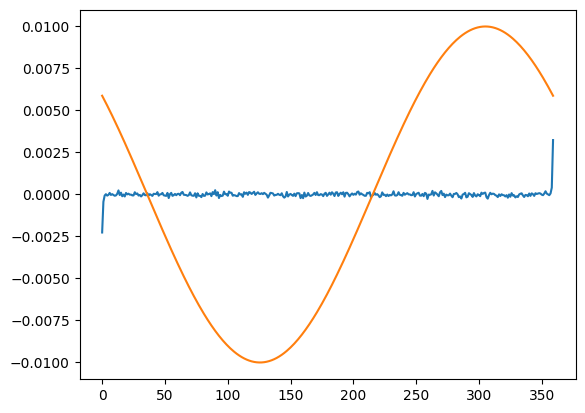

tensor([2.1389e-01, 4.7667e-02, 7.4236e-03, 9.9797e-01, 7.7018e-03, 2.6792e-03,
        9.8959e-01, 3.1768e-03, 9.9777e-01, 3.2242e-03, 8.7018e-03, 6.2650e-03,
        9.9570e-01, 9.7305e-01, 3.6481e-03, 9.8775e-01, 1.1974e-02, 7.2096e-04,
        1.3150e-02, 9.8997e-01, 9.9913e-01, 9.9462e-01, 1.3072e-03, 8.8003e-04,
        6.3160e-03, 6.2326e-03, 9.8515e-01, 9.9743e-01, 9.9305e-01, 7.1929e-03,
        3.0352e-03, 1.3243e-02, 4.4876e-03, 9.9228e-01, 3.8724e-03, 5.6099e-03,
        9.9199e-01, 6.8763e-03, 9.9810e-01, 3.1812e-03, 9.5706e-03, 9.9528e-01,
        9.9686e-01, 9.9710e-01, 9.8422e-01, 7.9783e-03, 9.9938e-01, 9.9812e-01,
        9.8955e-01, 5.5990e-03, 7.4680e-03, 9.4684e-03, 9.8946e-01, 2.3560e-02,
        9.9794e-01, 9.8925e-01, 9.2912e-03, 4.6101e-03, 9.9632e-01, 4.9840e-03,
        9.9648e-01, 9.9533e-01, 4.8512e-03, 9.8861e-01, 9.8288e-01, 1.8075e-03,
        3.2179e-03, 4.1692e-03, 9.1714e-03, 4.3269e-03, 9.8618e-01, 5.2265e-03,
        8.2607e-03, 8.7780e-03, 9.9180e-

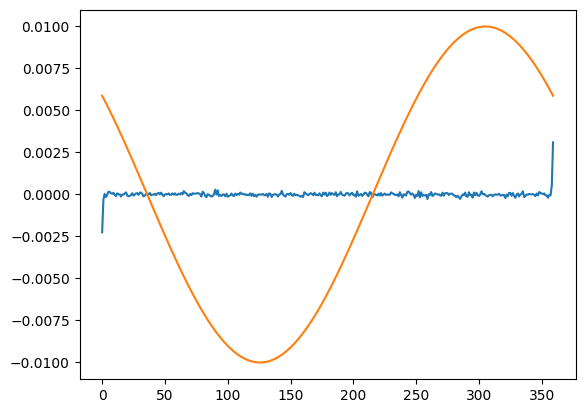

tensor([2.1050e-01, 3.3565e-02, 9.9588e-01, 1.6844e-02, 2.6613e-03, 9.8192e-01,
        9.8166e-01, 9.9185e-01, 9.9563e-01, 9.8830e-01, 2.5399e-03, 1.0754e-02,
        9.9203e-01, 9.9911e-01, 9.9921e-01, 1.3378e-02, 3.6449e-04, 5.9834e-04,
        9.9322e-01, 9.8569e-01, 6.9205e-03, 1.2314e-02, 9.4876e-03, 2.8350e-03,
        9.9150e-01, 7.4686e-03, 9.2032e-04, 9.9261e-01, 9.9142e-01, 2.4667e-03,
        9.8792e-01, 9.8709e-01, 9.9735e-01, 1.3256e-02, 7.1849e-03, 9.9720e-01,
        3.3908e-05, 9.9567e-01, 9.9028e-01, 5.1708e-03, 7.9352e-04, 8.0950e-04,
        9.9535e-01, 4.5288e-03, 9.9324e-01, 9.8837e-01, 9.9973e-01, 9.8786e-01,
        1.9914e-03, 1.1644e-02, 8.1438e-05, 9.9646e-01, 9.9994e-01, 9.9285e-01,
        3.3968e-03, 8.1016e-04, 9.9202e-01, 9.9595e-04, 9.9234e-01, 2.8231e-03,
        1.5690e-03, 9.9448e-01, 9.9983e-01, 9.9030e-01, 9.9892e-01, 9.7743e-01,
        9.8794e-01, 9.9196e-01, 4.9236e-03, 1.0104e-02, 9.9648e-01, 4.5451e-03,
        9.9166e-01, 9.9639e-01, 9.9342e-

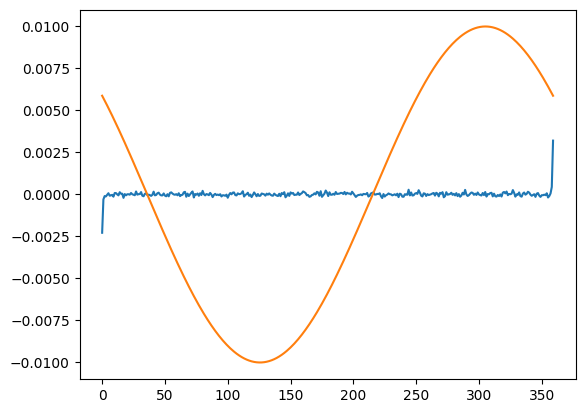

tensor([2.1227e-01, 3.2945e-02, 1.0786e-02, 1.2886e-02, 2.7656e-03, 9.9160e-01,
        8.2568e-03, 6.2334e-03, 2.5728e-03, 1.4396e-02, 9.9041e-01, 9.9046e-01,
        9.9932e-01, 6.0180e-03, 9.8488e-01, 9.9465e-01, 9.9474e-01, 2.2351e-02,
        9.9738e-01, 5.7243e-03, 9.9854e-01, 9.9845e-01, 1.4524e-03, 9.8983e-01,
        9.9858e-01, 2.0635e-03, 5.0970e-03, 9.8011e-01, 1.0305e-03, 9.9801e-01,
        9.9690e-01, 9.8391e-01, 8.4910e-03, 1.1974e-02, 9.9602e-01, 9.9192e-01,
        3.9503e-03, 1.3253e-03, 4.3108e-03, 9.5928e-03, 2.0843e-03, 9.8132e-01,
        5.7083e-03, 3.3862e-03, 9.9177e-01, 9.8772e-01, 5.1035e-04, 6.2251e-03,
        6.0941e-03, 9.9309e-01, 7.6884e-03, 1.2161e-02, 9.9829e-01, 1.2298e-02,
        9.8931e-01, 9.8569e-01, 9.9355e-01, 9.9963e-01, 1.8791e-03, 9.9784e-01,
        5.3279e-03, 9.9173e-01, 1.1254e-02, 4.2134e-03, 1.9229e-03, 9.8557e-01,
        9.8206e-01, 1.5141e-02, 9.9442e-01, 1.0321e-02, 9.9945e-01, 9.8851e-01,
        9.7966e-01, 1.9951e-02, 9.9666e-

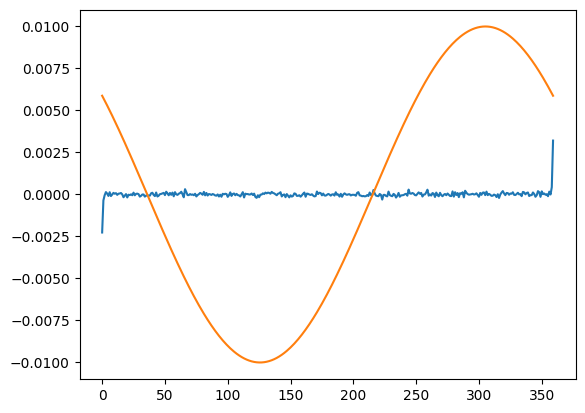

tensor([2.1231e-01, 3.9036e-02, 5.0719e-03, 9.8409e-01, 9.9385e-01, 9.7511e-03,
        9.8493e-01, 1.0593e-02, 4.3013e-04, 9.8908e-01, 9.9473e-01, 9.9108e-01,
        2.6100e-03, 9.9469e-01, 9.9331e-01, 9.9008e-01, 9.9905e-01, 1.8508e-02,
        7.7030e-03, 9.9757e-01, 1.9728e-02, 1.6936e-03, 4.2627e-03, 9.9923e-01,
        5.2119e-03, 9.8780e-01, 5.3794e-03, 9.9570e-01, 9.9445e-01, 9.9774e-01,
        1.4606e-02, 8.9990e-03, 1.5328e-04, 3.1787e-04, 1.4527e-02, 7.0508e-03,
        7.6852e-03, 6.6555e-03, 7.6907e-03, 9.9211e-01, 9.8831e-01, 2.8363e-03,
        1.0755e-02, 9.8694e-01, 1.3758e-02, 7.9972e-03, 9.9798e-01, 9.9619e-01,
        9.9268e-01, 9.8915e-01, 4.1513e-03, 9.8166e-01, 9.9220e-01, 5.2611e-03,
        9.8986e-01, 2.1577e-03, 9.8751e-01, 1.2048e-02, 9.8471e-01, 9.9904e-01,
        2.6624e-03, 9.9477e-01, 9.9072e-01, 9.8171e-01, 9.9861e-01, 1.8068e-02,
        9.6581e-01, 9.8356e-01, 3.9718e-03, 4.1732e-03, 9.9720e-01, 2.2694e-03,
        9.9982e-01, 4.9915e-03, 9.9530e-

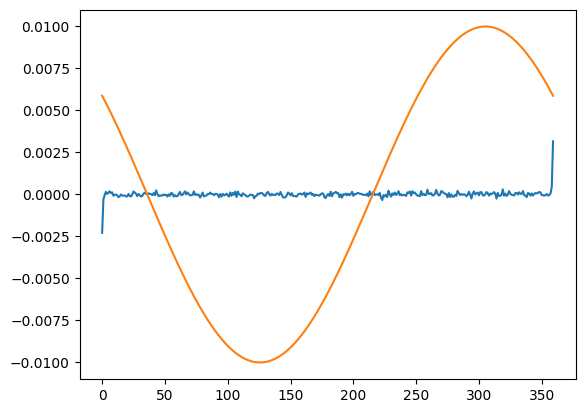

tensor([2.1280e-01, 3.3808e-02, 4.1419e-03, 9.8267e-01, 9.9645e-01, 9.8736e-01,
        9.7874e-01, 9.9045e-01, 9.8566e-01, 8.6392e-03, 1.8951e-03, 4.7490e-04,
        5.5407e-03, 1.8091e-02, 1.2678e-02, 9.9996e-01, 7.0182e-03, 8.1070e-03,
        6.6895e-03, 1.2650e-02, 1.2838e-02, 9.9604e-01, 1.0437e-02, 1.3374e-02,
        9.9935e-01, 9.7997e-01, 9.8732e-01, 9.9417e-01, 1.1400e-02, 9.9664e-01,
        4.7329e-03, 1.3795e-02, 9.1672e-03, 9.9373e-01, 9.8817e-01, 9.9666e-01,
        9.9734e-01, 9.9308e-01, 9.9528e-01, 9.9771e-01, 3.8745e-03, 9.9060e-01,
        4.6691e-03, 9.7289e-01, 9.9761e-01, 1.1739e-02, 5.7195e-03, 8.9134e-03,
        5.5802e-03, 9.9922e-01, 5.2851e-03, 2.0325e-03, 1.3224e-02, 9.9900e-01,
        9.1027e-03, 9.8925e-01, 9.9363e-01, 1.3765e-02, 4.7551e-03, 1.2051e-02,
        1.0395e-02, 9.9502e-01, 9.8321e-01, 5.2335e-03, 1.8130e-03, 9.9130e-01,
        9.7865e-01, 9.9989e-01, 9.8664e-01, 9.9722e-01, 6.4564e-03, 4.2595e-03,
        3.1777e-03, 9.7921e-01, 2.6572e-

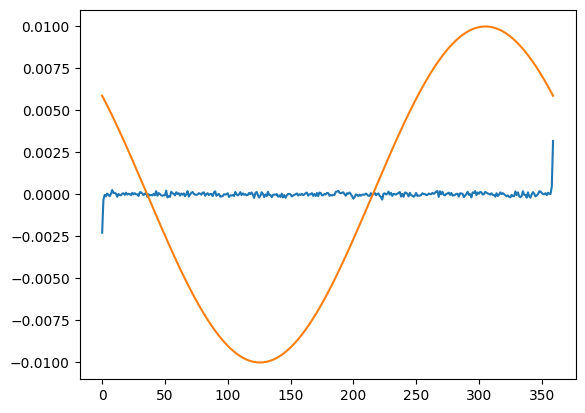

early stopped


In [9]:
from torch import nn
from motion import EarlyStopping
from motion import AngleEstimator

torch.cuda.empty_cache()

sino = torch.Tensor(sinogram[None, None, ...]).cuda()
assumed_angles, size = np.linspace(0, np.pi, 360), 512
ae = AngleEstimator(sino, assumed_angles).cuda()

optimizer = torch.optim.Adam(params=ae.parameters(), lr=1e-3)
early_stopping = EarlyStopping(model=ae, patient=3)

for epoch in range(100):
    for step in range(10):
        optimizer.zero_grad()
        loss = ae.loss()
        loss.backward()
        optimizer.step()
        
    print('epoch {} - loss: {}'.format(epoch, loss))

    with torch.no_grad():
        plt.plot(ae.theta.cpu().detach().numpy() - assumed_angles)
        plt.plot(shift)
        plt.show()
    
    if early_stopping(loss):
        print('early stopped')
        ae.load_state_dict(early_stopping.best_model)
        break

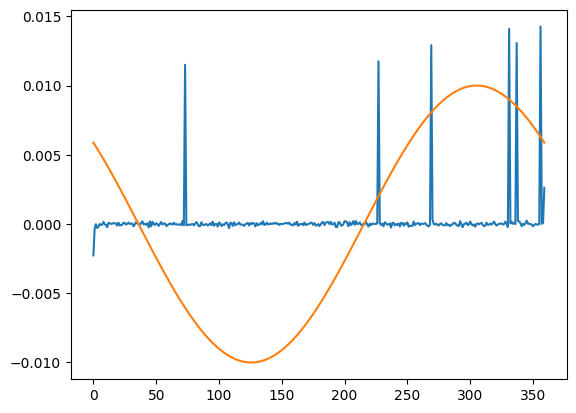

In [17]:
plt.plot(ae.theta.cpu().detach().numpy() - assumed_angles)
plt.plot(shift)

In [21]:
sino = ae().cpu().detach().numpy()

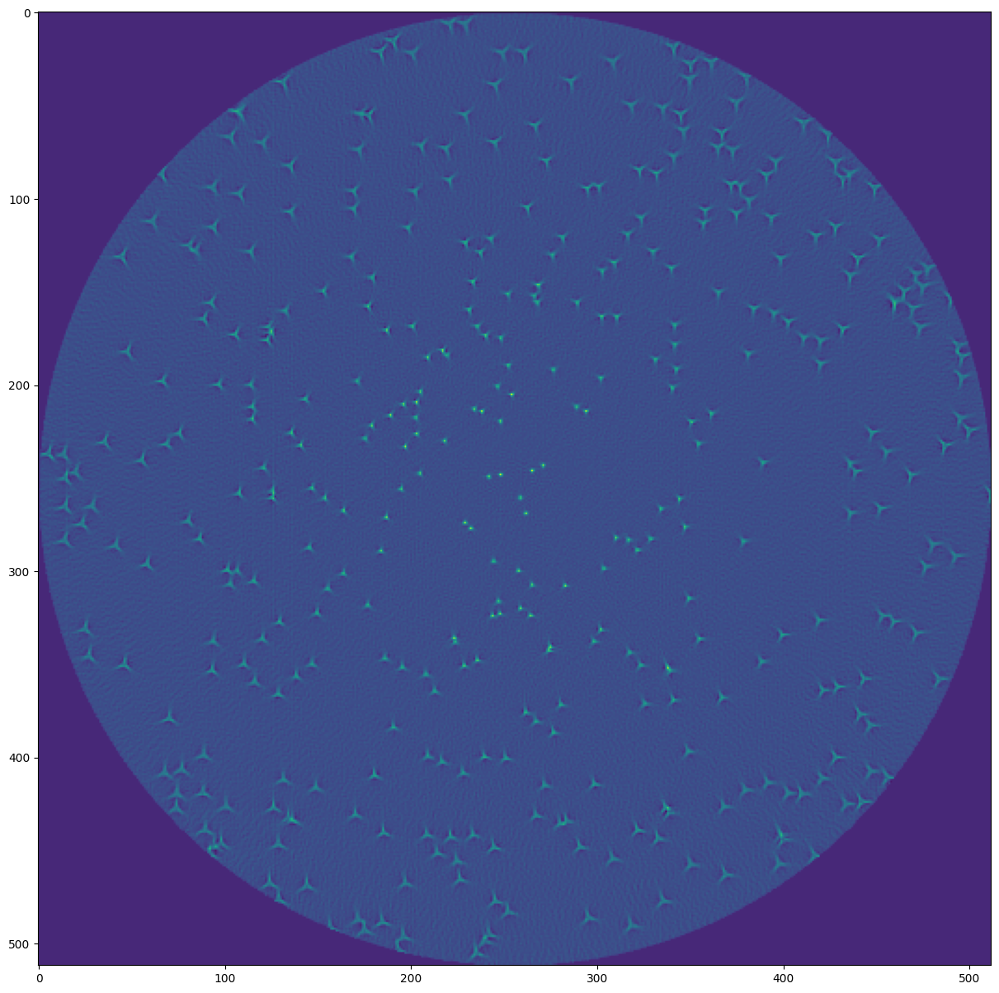

In [25]:
recon = iradon(sino[0,0], assumed_angles / np.pi * 180, filter_name='ramp')
plt.figure(figsize=(15, 15))
plt.imshow(recon)

## Sampling

In [11]:
import tomopy

n_angles, m = number_projection, phantom_size[0]

rng = np.random.default_rng()
mu = assumed_angles
theta_var = np.pi / n_angles * 0.5
cov = np.identity(n_angles) * theta_var

X = iradon(sinogram, mu / np.pi * 180, filter_name='ramp')
sino_mu = radon(X, mu / np.pi * 180).T

n_samples = 30
errors = np.zeros((n_samples, n_angles, m))
thetas = np.zeros((n_samples, n_angles))
for i in range(n_samples):
    thetas[i] = rng.multivariate_normal(mu, cov)
    errors[i] = radon(X, thetas[i] / np.pi * 180).T - sino_mu
    # tomopy.sim.project.project(phantom, )

In [12]:
noise_var = 0.01
alpha = 0.5

error_mu = errors.mean(axis=0) # (a, m)
error_shifted = errors - error_mu # (s, a, m)
theta_shifted = thetas - thetas.mean() # (s, a)
error_cov = np.einsum('mijk,mikl->ijl', error_shifted[..., np.newaxis], error_shifted[:, :, np.newaxis, :], optimize=True) / (n_samples - 1) # (a, m, m)
error_theta_cov = (error_shifted * theta_shifted[..., np.newaxis]).sum(axis=0) / (n_samples - 1) # (a, m)
error_theta_cov = error_theta_cov[:, np.newaxis, :] # (a, 1, m)

inv_error_cov =  np.linalg.inv(error_cov + np.identity(m) * noise_var ** 2) # (a, m, m)
ctc = error_theta_cov @ inv_error_cov # (a, 1, m)

new_mu = mu + np.squeeze(ctc @ (sinogram.T - sino_mu - error_mu)[..., np.newaxis])
new_theta_var = theta_var - alpha * np.squeeze(ctc @ error_theta_cov.T) # (a)

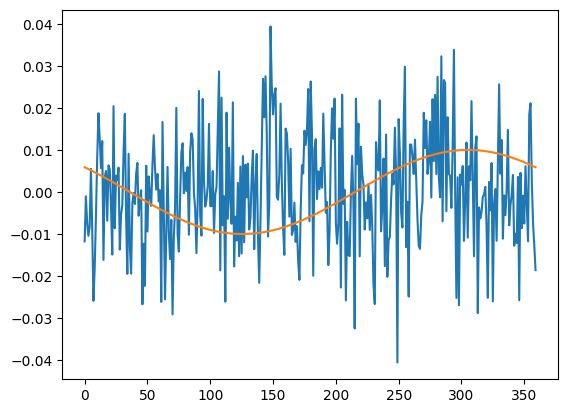

In [13]:
plt.plot(new_mu - mu)
plt.plot(shift)
# plt.plot(mu)

In [170]:
a = error_theta_cov @ np.linalg.inv(error_cov + np.identity(m) * sigma ** 2) @ (sinogram.T - sino_mu - error_mu)[..., np.newaxis]

In [171]:
a.shape

(360, 1, 1)

In [169]:
mu.shape

(360,)

In [164]:
error_cov.shape

(360, 512, 512)

## ART gradient decent

In [120]:
import lightning.pytorch as pl
from torch import nn
from torch.nn import functional as F

class ARTreconstructor(pl.LightningModule):
    def __init__(self, size, assumed_angles):
        super().__init__()

        self.loss_nn = nn.L1Loss()
        self.recon = nn.Parameter(torch.zeros((1, 1, size, size), dtype=torch.float32))

        self.n_angles = len(assumed_angles)
        self.size = size
        
        self.register_buffer('assumed_angles', torch.Tensor(assumed_angles))
        self.theta_shift = nn.Parameter(torch.zeros_like(self.assumed_angles))
        
        grid_y, grid_x = torch.meshgrid(torch.linspace(-1, 1, self.size), torch.linspace(-1, 1, self.size))
        self.reconstruction_circle = (grid_x ** 2 + grid_y ** 2) <= 1
        self.reconstruction_circle = self.reconstruction_circle[None, None, ...].repeat(1, 1, 1, 1)
        
        self.register_buffer('zeros', torch.zeros_like(self.theta_shift))
        
    def forward(self):
        thetas = torch.cumsum(self.theta_shift, dim=0) + self.assumed_angles
        
        recon = self.recon.clone()
        recon[~self.reconstruction_circle] = 0
        
        cos_al, sin_al = thetas.cos(), thetas.sin()
        trans_matrix = torch.stack((cos_al, sin_al, self.zeros, -sin_al, cos_al, self.zeros),-1).reshape(-1, 2, 3)
        grid = F.affine_grid(trans_matrix, torch.Size([self.n_angles, 1, self.size, self.size]), align_corners=True).reshape(1, -1, self.size, 2)
        out = F.grid_sample(recon, grid, align_corners=True, mode='bilinear').reshape(1, 1, self.n_angles, self.size, self.size)
        
        return out.sum(3).permute(0, 1, 3, 2) # (bsz, 1, W, n_angles)

epoch 0 - loss: 20.628875732421875


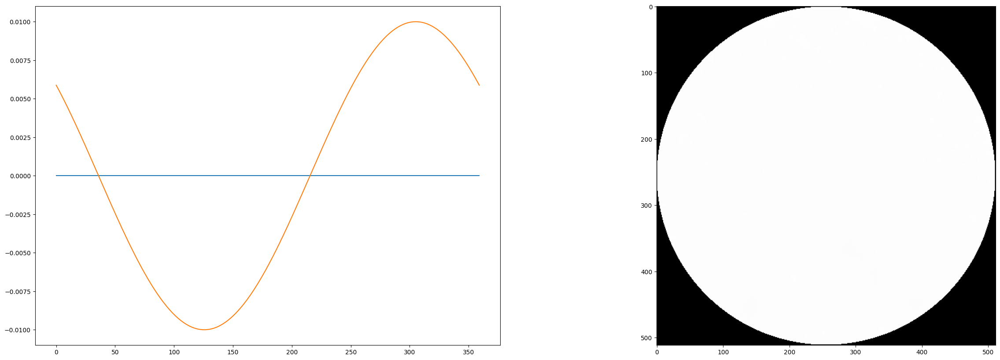

epoch 1 - loss: 0.28064683079719543


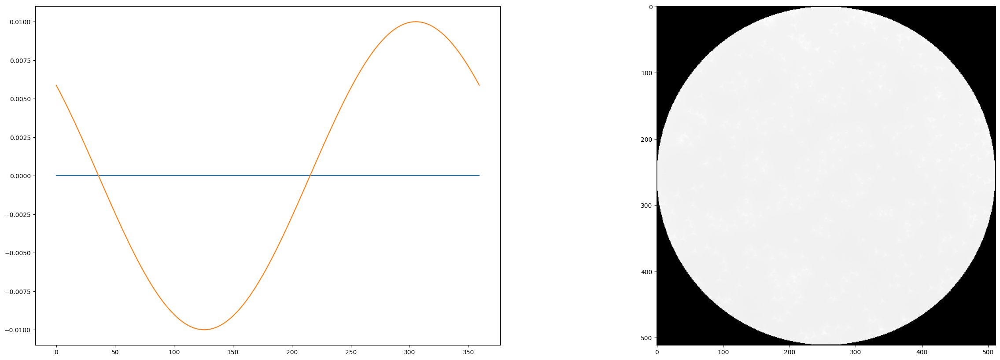

epoch 2 - loss: 0.25618430972099304


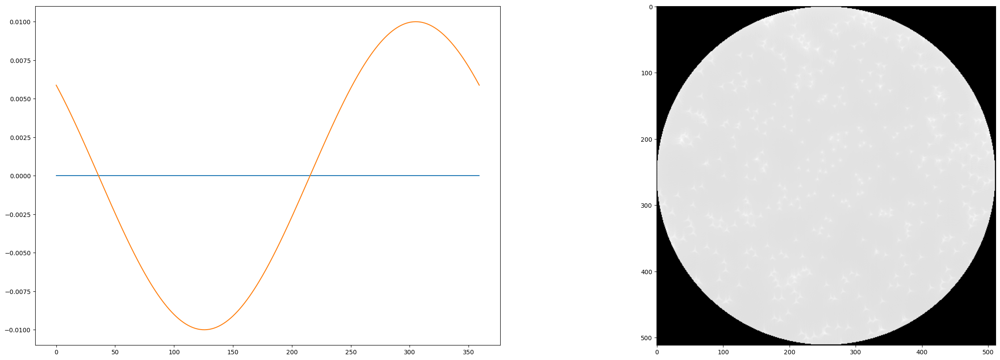

epoch 3 - loss: 0.24359366297721863


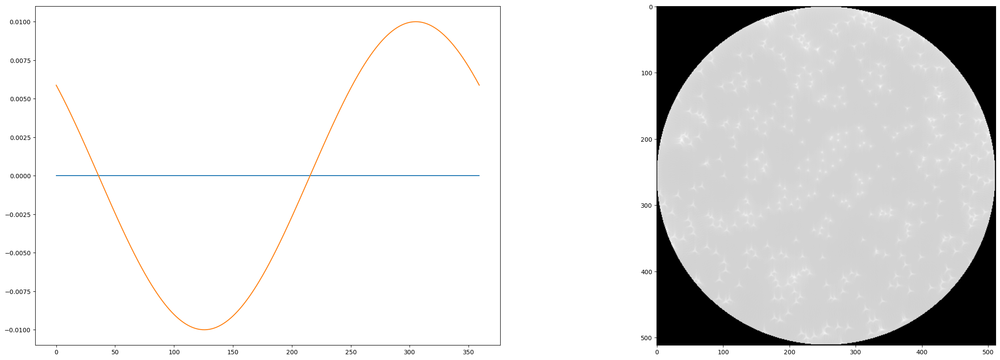

epoch 4 - loss: 0.23172396421432495


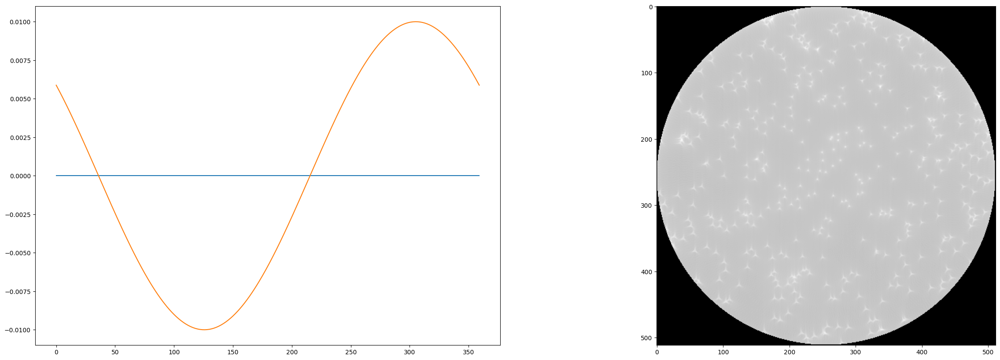

epoch 5 - loss: 0.22047382593154907


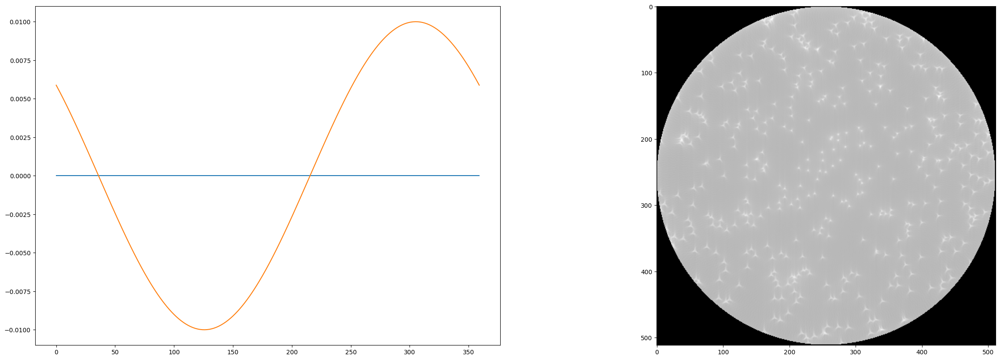

epoch 6 - loss: 0.20980750024318695


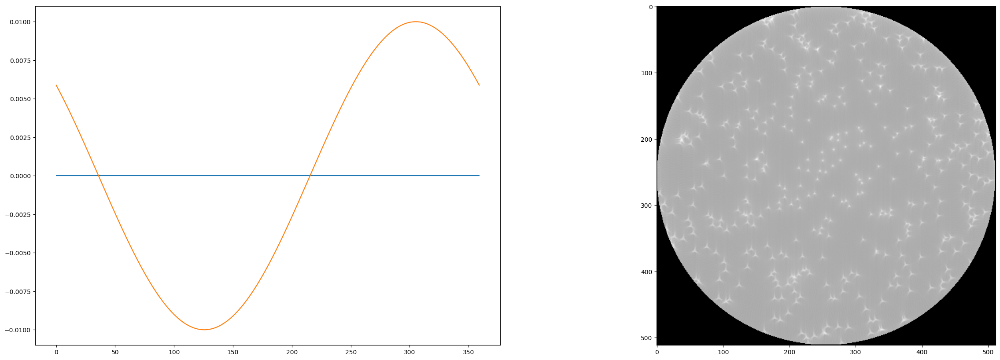

epoch 7 - loss: 0.1996929794549942


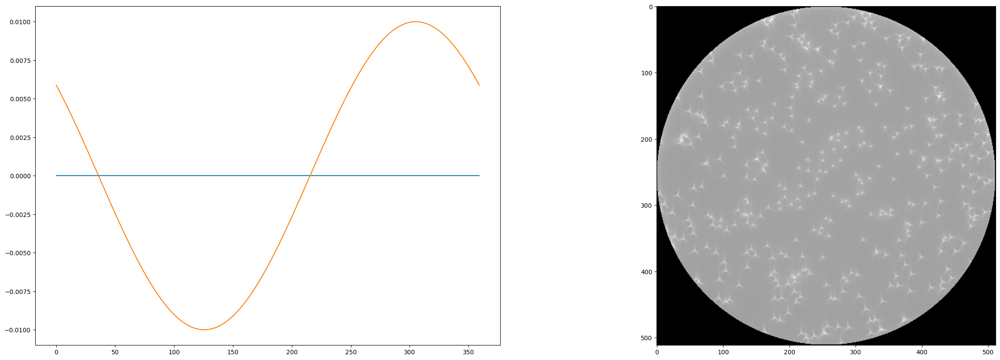

epoch 8 - loss: 0.1900964081287384


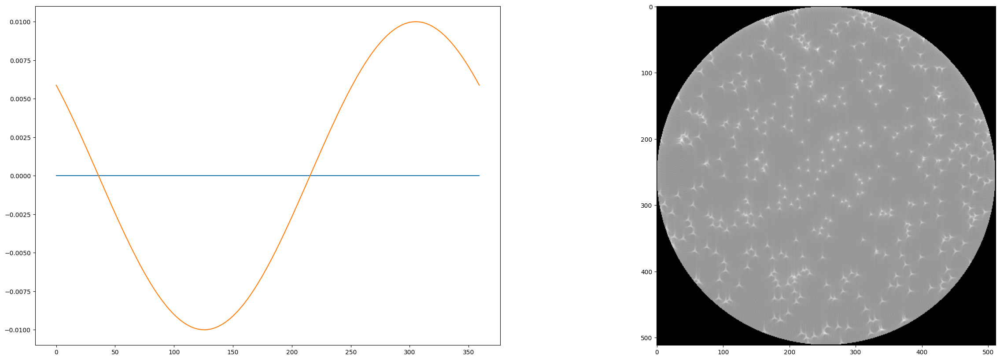

epoch 9 - loss: 0.1809837371110916


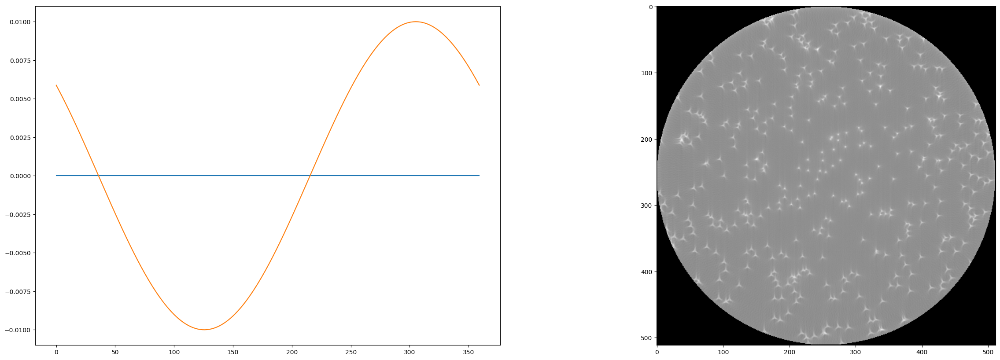

epoch 10 - loss: 0.17232246696949005


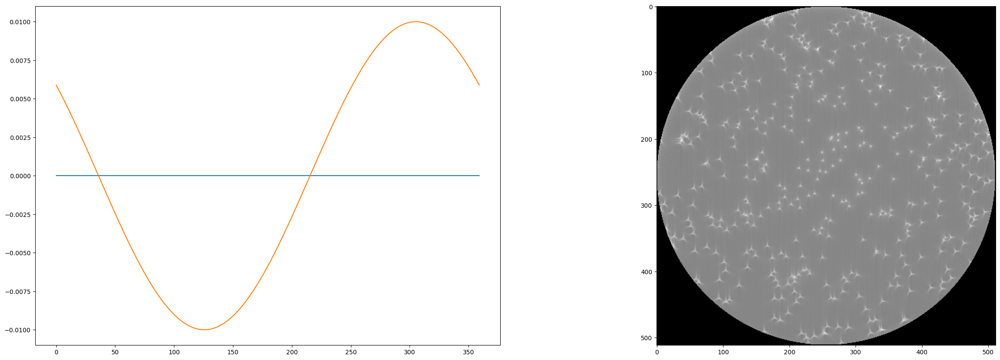

epoch 11 - loss: 2163.448486328125


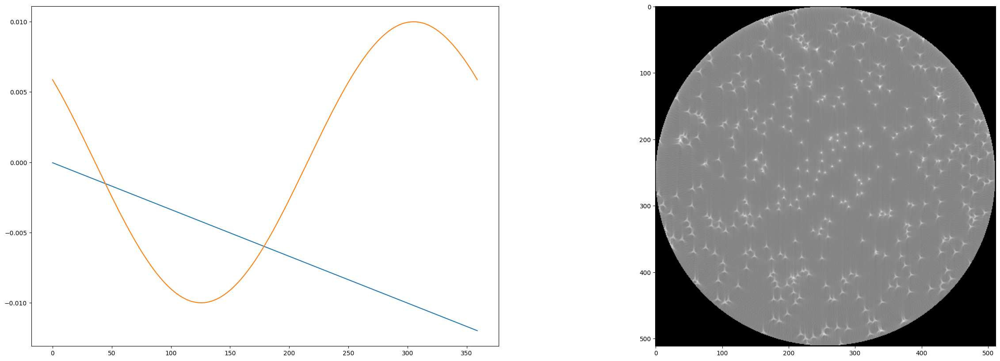

epoch 12 - loss: 17061.375


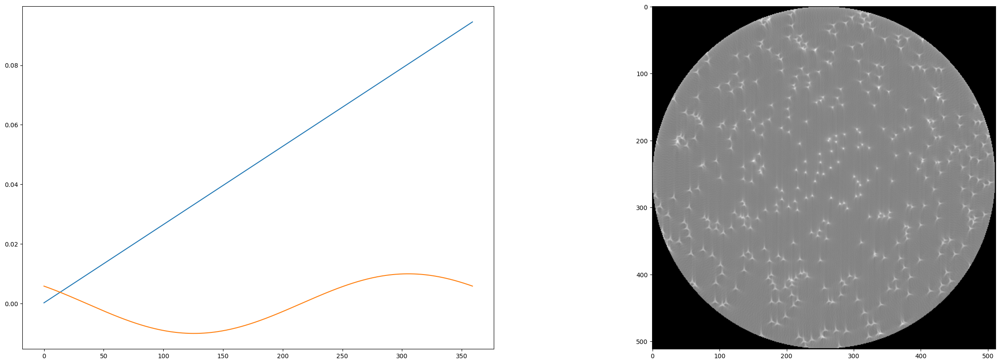

epoch 13 - loss: 7824.50830078125


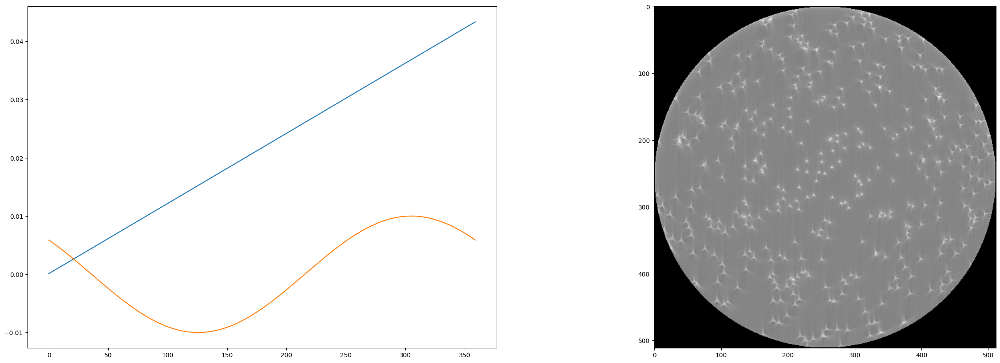

epoch 14 - loss: 11358.958984375


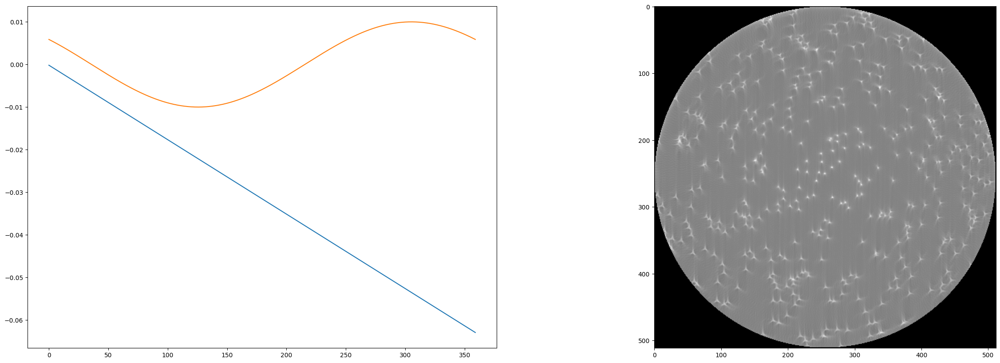

early stopped


In [130]:
from torch import nn
from motion import EarlyStopping

y = torch.Tensor(sinogram[None, None, ...]).cuda()
assumed_angles, size = np.linspace(0, np.pi, 360), 512
reconstructor = ARTreconstructor(size, assumed_angles).cuda()

criterion = nn.MSELoss().cuda()
optimizer = torch.optim.Adam(params=reconstructor.parameters(), lr=1e-3)

early_stopping = EarlyStopping(model=reconstructor, patient=3)

for epoch in range(100):
    for step in range(100):
        reconstructor.theta_shift.requires_grad = True
        reconstructor.recon.requires_grad = True
        
        if step % 10 < 5:
            if epoch > 10:
                reconstructor.recon.requires_grad = False
            else:
                continue
        else:
            reconstructor.theta_shift.requires_grad = False
        
        optimizer.zero_grad()
        loss = criterion(reconstructor(), y)
        loss = loss + 1000. * torch.cumsum(reconstructor.theta_shift, dim=0).abs().sum()
        loss.backward()
        optimizer.step()
        
    print('epoch {} - loss: {}'.format(epoch, loss))
    with torch.no_grad():
        fig, axes = plt.subplots(1, 2, figsize=(30, 10))
        # axes[0].imshow(sinogram, cmap='gray')
        axes[0].plot(torch.cumsum(reconstructor.theta_shift, dim=0).detach().cpu().numpy())
        axes[0].plot(shift)
        axes[1].imshow(reconstructor.recon.detach().cpu().numpy()[0, 0], cmap='gray')
        plt.show()
    
    if early_stopping(loss):
        print('early stopped')
        reconstructor.load_state_dict(early_stopping.best_model)
        break

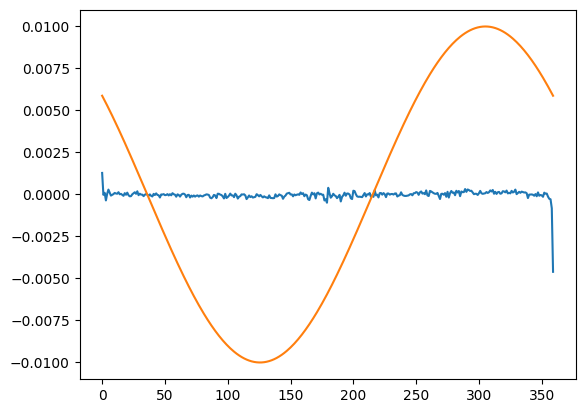

In [88]:
plt.plot(reconstructor.thetas.detach().cpu().numpy()[:, 0, 0] - np.linspace(0, np.pi, 360))
plt.plot(shift)

In [46]:
reconstructor.state_dict()['thetas'] = assumed_angles
reconstructor.thetas.requires_grad = True

epoch 0 - loss: 0.020859232172369957


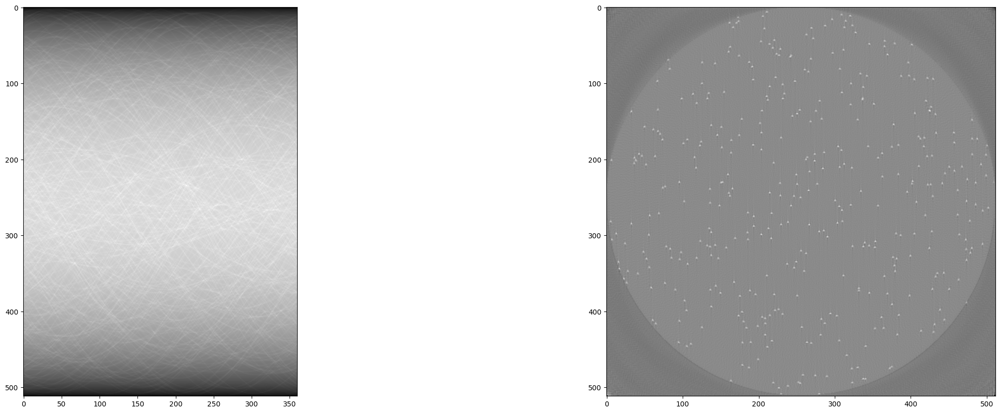

epoch 1 - loss: 0.022987227886915207


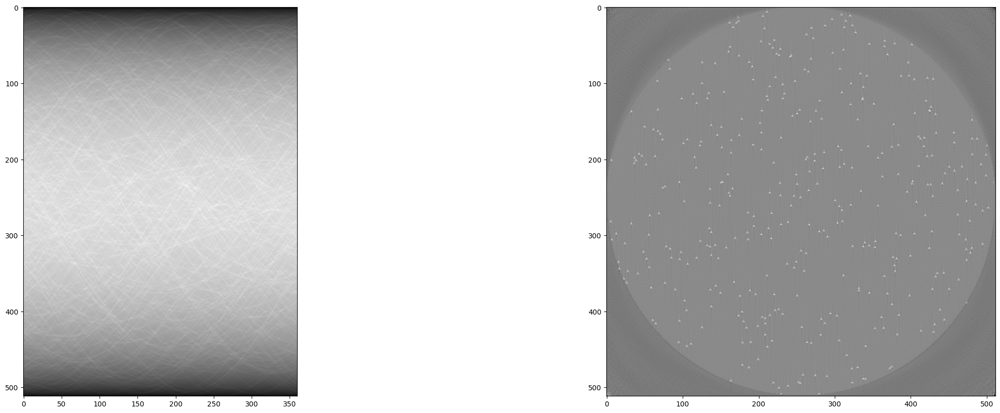

epoch 2 - loss: 0.021318713203072548


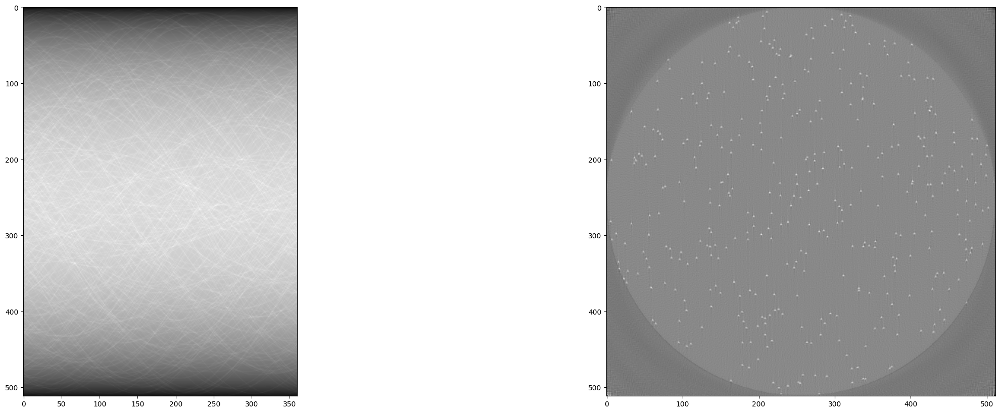

epoch 3 - loss: 0.021521417424082756


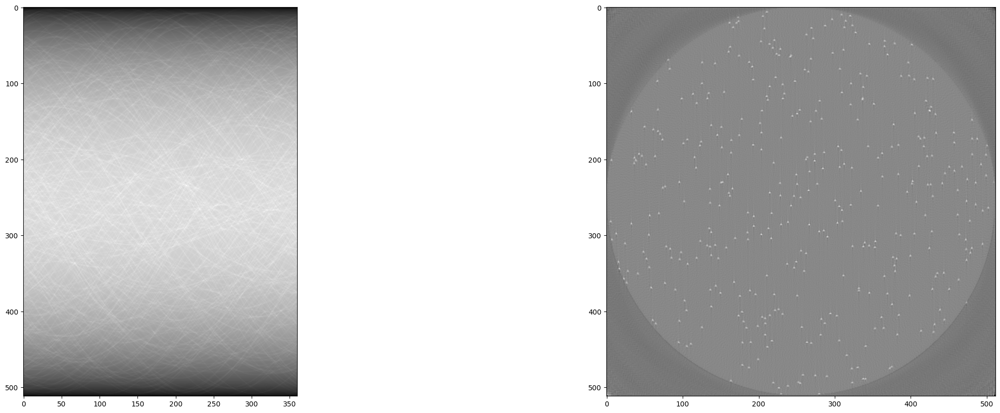

epoch 4 - loss: 0.02211259864270687


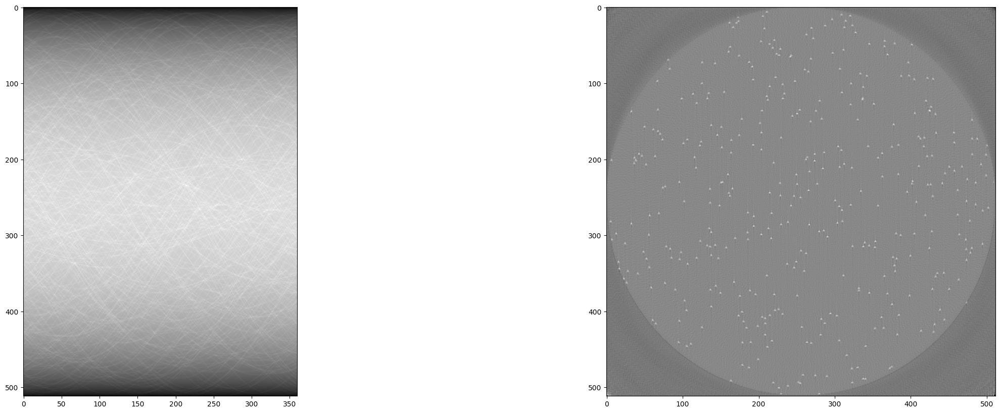

early stopped


In [47]:
optimizer = torch.optim.Adam(params=reconstructor.parameters(), lr=1e-3)
early_stopping = EarlyStopping(model=reconstructor, patient=3)

for epoch in range(100):
    for step in range(50):
        optimizer.zero_grad()
        loss = criterion(reconstructor(), y)
        loss.backward()
        optimizer.step()
    
    print('epoch {} - loss: {}'.format(epoch, loss))
    with torch.no_grad():
        fig, axes = plt.subplots(1, 2, figsize=(30, 10))
        axes[0].imshow(sinogram, cmap='gray')
        axes[1].imshow(reconstructor.recon.detach().cpu().numpy()[0, 0], cmap='gray')
        plt.show()
    
    if early_stopping(loss):
        print('early stopped')
        reconstructor.load_state_dict(early_stopping.best_model)
        break

In [19]:
art = ARTreconstructor(phantom_size[0], assumed_angles)

In [20]:
X = art()

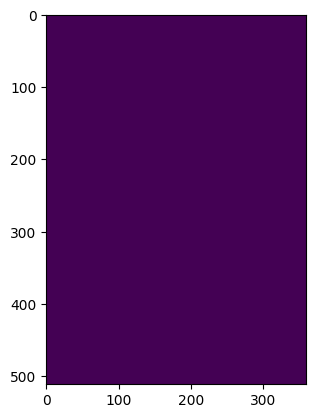

In [22]:
plt.imshow(X.detach().numpy()[0, 0])

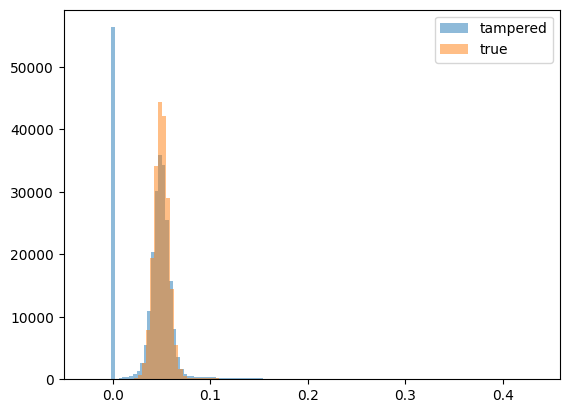

In [75]:
size = phantom_size[0]
center = size // 2
mask = np.mgrid[:size, :size]
mask = ((mask[0] - center) ** 2 + (mask[1] - center) ** 2) < (size // 2 * 0.9) ** 2

_ = plt.hist(ma.masked_array(tampered_reconstructed, ~mask).flatten(), bins=100, alpha=0.5, label='tampered')
_ = plt.hist(ma.masked_array(true_reconstructed, ~mask).flatten(), bins=100, alpha=0.5, label='true')
plt.legend()

In [15]:
random_dots = np.random.uniform(0, min(*phantom_size), number_dots*2).reshape(2, -1)
phantom = get_phantom(phantom_size, random_dots, background)

def f(A, w, phi):
    shift = A * 0.001 * np.cos(assumed_angles * w + phi)
    true_angles = assumed_angles + shift

    plt.figure(figsize=(15, 3))
    plt.plot(assumed_angles, shift)
    plt.xlabel('assumed projection angle in radian')
    plt.ylabel('shift in radian')
    plt.title('angle shift')
    
    tick_locs = np.linspace(0, 1, 6)
    tick_labels = [f'{i:.1f}π' if i > 0 else '0' for i in tick_locs]
    plt.xticks(tick_locs * np.pi, tick_labels)
    plt.show()

    sinogram = radon(phantom, true_angles / np.pi * 180)    # (phantom_size, number_projection)
    tampered_reconstructed = iradon(sinogram, assumed_angles / np.pi * 180, filter_name='ramp')

    plt.figure(figsize=(10, 10))
    plt.imshow(tampered_reconstructed, cmap='gray')
    plt.title('reconstruction with assumed angles')
    plt.show()

interactive(f, {'manual': True}, A=(0, 20, 0.1), w=(0, 5, 0.1), phi=(0, 2 * np.pi, 0.05 * np.pi))

interactive(children=(FloatSlider(value=10.0, description='A', max=20.0), FloatSlider(value=2.0, description='…